In [20]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

%load_ext autoreload
%autoreload 2

from gradio_utils import motionctrl_cmcm_gradio
import torch
from gradio_utils import camera_utils
import numpy as np
import viz
import visu3d as v3d
from tqdm import tqdm

# !nvidia-smi

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [21]:
num_frames = 14
num_steps = 25
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device {device}")

config = "configs/inference/config_motionctrl_cmcm.yaml"
ckpt='motionctrl_svd.ckpt'

model = motionctrl_cmcm_gradio.build_model(
    config,
    ckpt,
    device,
    num_frames,
    num_steps)

Using device cuda
Loading model from motionctrl_svd.ckpt
Initialized embedder #0: FrozenOpenCLIPImagePredictionEmbedder with 683800065 params. Trainable: False
Initialized embedder #1: ConcatTimestepEmbedderND with 0 params. Trainable: False
Initialized embedder #2: ConcatTimestepEmbedderND with 0 params. Trainable: False
Initialized embedder #3: VideoPredictionEmbedderWithEncoder with 83653863 params. Trainable: False
Initialized embedder #4: ConcatTimestepEmbedderND with 0 params. Trainable: False
Restored from motionctrl_svd.ckpt with 0 missing and 0 unexpected keys


In [22]:
type(model)

sgm.motionctrl.camera_motion_control.CameraMotionControl

In [23]:
def get_cam_angle(angle):
    R = camera_utils.compute_R_form_rad_angle(
        np.array(angle))
    T = np.array([0, 0, 0])
    cam = np.concatenate([R, T[:,None]], axis=1)
    
    return cam

cam_acw = get_cam_angle([0, 0, 1])
cam_cw = get_cam_angle([0, 0, -1])
cam_id = get_cam_angle([0, 0, 0])
cam_eye = np.eye(4)

viz_cam_acw = viz.get_camera_matrices_as_rays((None, cam_acw[None]))
viz_cam_cw = viz.get_camera_matrices_as_rays((None, cam_cw[None]))
viz_cam_id = viz.get_camera_matrices_as_rays((None, cam_id[None]))
viz_cam_eye = viz.get_camera_matrices_as_rays((None, cam_eye[None]))


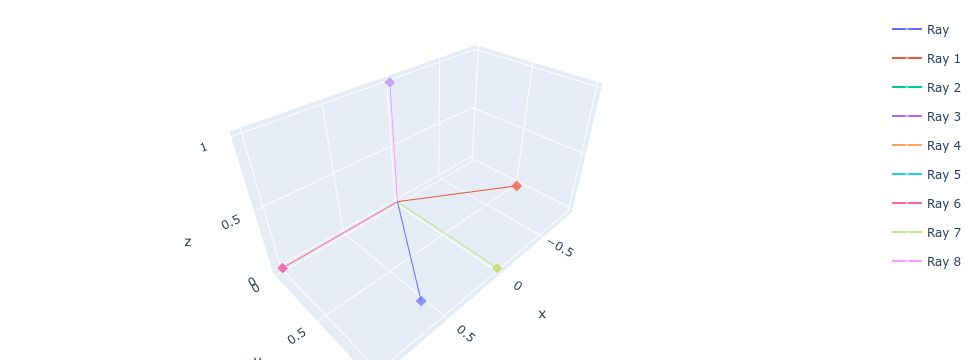

In [24]:
v3d.make_fig(
    *viz_cam_acw,
    # *viz_cam_cw,
    *viz_cam_id,
    *viz_cam_eye,
)

In [29]:
import sys

def load_dm():
    del sys.modules['sgm']
    sys.path.insert(0, '/home/jupyter/generative-models/')
    import sgm
    
    import mediapy
    from sgm.data.massive import webdataset_utils
    from sgm.data.massive import webdataset_co3d
    from tqdm import tqdm
    from omegaconf import OmegaConf
    from sgm.util import exists, instantiate_from_config, isheatmap
    import torch

    config = OmegaConf.load('/home/jupyter/generative-models/configs/example_training/svd_train.yaml')
    config2 = OmegaConf.load('/home/jupyter/generative-models/configs/example_training/sketch.yaml')
    config = OmegaConf.merge(config, config2)

    config.data.params.train_config.batch_size = 1
    config.data.params.val_config.batch_size = 1

    # config.data.params.train_config.dataset_config_1.dataset_url = "gs://xcloud-shared/kylesargent/mit_unresized/mit_val__{shard:04d}.tar"
    # config.data.params.train_config.dataset_config_1.dataset_n_shards = 1
    # config.data.params.train_config.dataset_config_1.dataset_url = "gs://xcloud-shared/kylesargent/bucketed_test/sstk__00010.tar"
    # config.data.params.train_config.dataset_config_1.dataset_n_shards = 1
    # config.data.params.train_config.dataset_config_1.dataset_url = "gs://xcloud-shared/kylesargent/flow_bucketed_sstk_576p_16frames_3fps_v2/sstk__99999.tar"
    # config.data.params.train_config.dataset_config_1.dataset_n_shards = 1

    config.data.params.val_config.dataset_config_1.dataset_url="gs://xcloud-shared/kylesargent/co3d_highres_v2/co3d__00002.tar"

    config.data.params.train_config.shuffle_buffer_size = 0
    config.data.params.train_config.num_workers = 0
    # config.data.params.train_config.downsample_f = "(192, 128)"
    # config.data.params.val_config.downsample_f = "(192, 128)"
    config.data.params.train_config.num_frames=14
    config.data.params.val_config.num_frames=14

    config.data.params.train_config.balance=1_000
    # config.data.params.train_config.downsample_f = "(384, 256)"
    # config.data.params.val_config.downsample_f = "(384, 256)"
    config.data.params.train_config.downsample_f = "(1024, 576)"
    config.data.params.val_config.downsample_f = "(1024, 576)"
    config.data.params.train_config.prefetch_factor = 2
    dm = instantiate_from_config(config.data)
    
    sys.path = sys.path[:1]
    import sgm
    
    return dm

dm = load_dm()

patching gopen
all urls 1
Made a loader!
['gs://xcloud-shared/kylesargent/co3d_highres_v2/co3d__00002.tar']
Must initialize DDP for node sharding.
n_batches_all= [1590]
n_batches= 1590


0it [00:00, ?it/s]

""

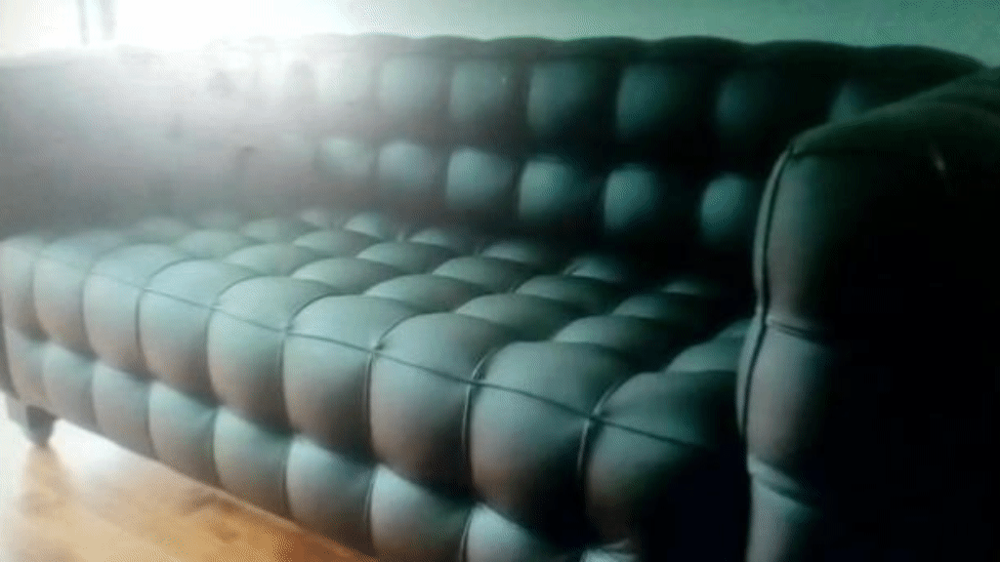

1it [00:08,  8.61s/it]

""

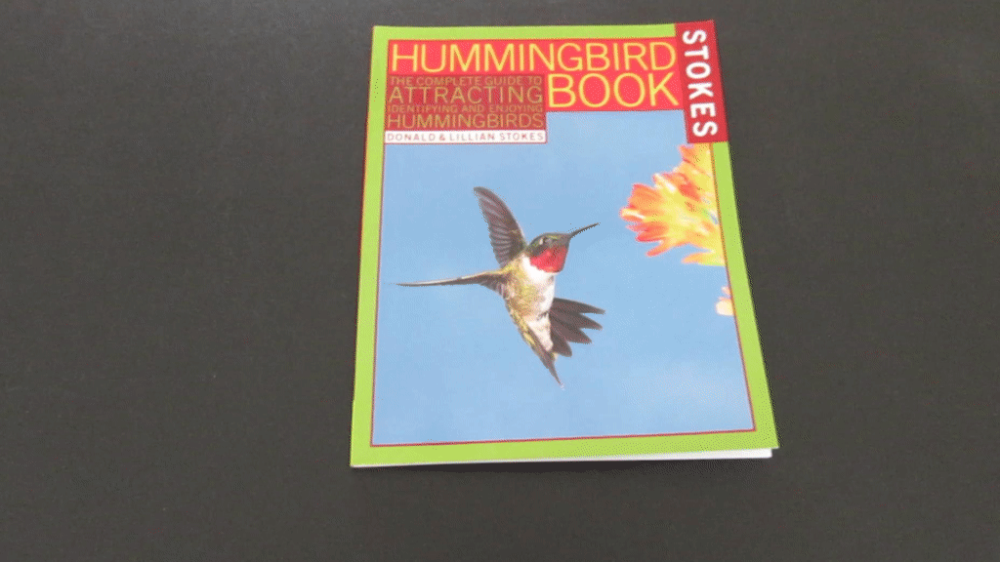

2it [00:14,  7.09s/it]

""

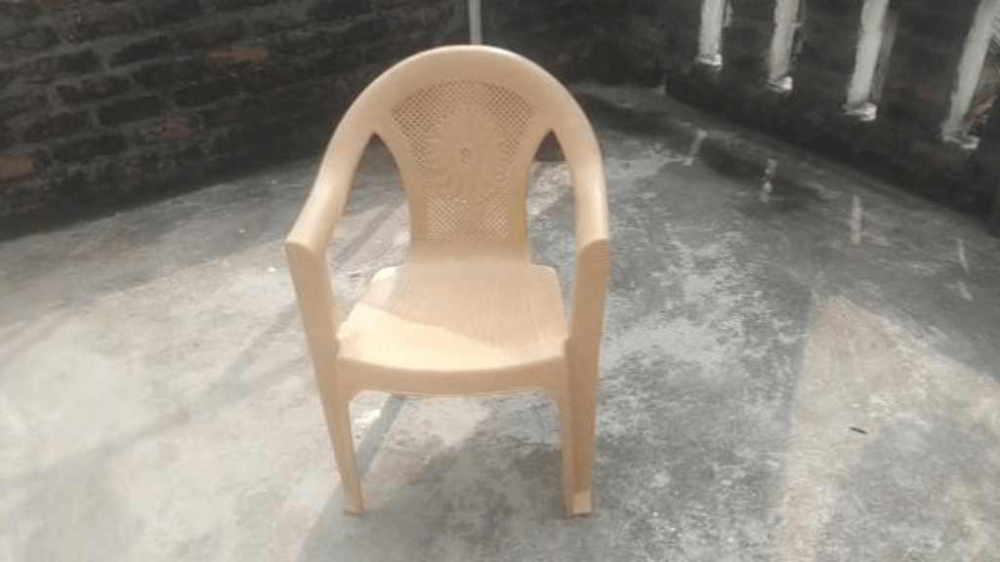

3it [00:22,  7.36s/it]

KeyboardInterrupt



In [30]:
dl = iter(dm.val_dataloader())
# dl = iter(dm.train_dataloader())
batches = []
for batch, idx in tqdm(zip(dl, range(25))):
    
    jpg = batch['jpg'].permute((0, 2, 3, 1))/2+.5
    jpg = jpg.cpu().numpy()
    mediapy.show_video(jpg, fps=4, codec='gif')
    
    batches.append(batch)
    # break
    # if idx == 10:
    #     break

In [38]:
batch_idx = 0
image = batches[batch_idx]['cond_frames_without_noise'][0]
image = image.permute((1,2,0))/2 + .5

image = viz.fi(image)

In [48]:
relative_pose = torch.linalg.inv(batch['aux_cond_cam2world']) @ batch['aux_target_cam2world']
relative_pose = relative_pose[:, :3].cpu().numpy()

motionctrl_cmcm_gradio.motionctrl_sample(model, image, relative_pose)

TypeError: unsupported operand type(s) for *: 'int' and 'NoneType'